In [8]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
import pickle

In [9]:
file_path = 'RML2016.10a_dict.dat'

try:
    with open(file_path, 'rb') as f:
        data = pickle.load(f, encoding='latin1')
        print(data.keys())
except Exception as e:
    print(f'Error: {str(e)}')

dict_keys([('QPSK', 2), ('PAM4', 8), ('AM-DSB', -4), ('GFSK', 6), ('QAM64', 8), ('AM-SSB', 12), ('8PSK', 8), ('8PSK', 12), ('QAM64', -6), ('QAM16', 2), ('QAM16', -20), ('PAM4', -6), ('WBFM', -18), ('AM-DSB', 16), ('CPFSK', 10), ('WBFM', 6), ('BPSK', 4), ('BPSK', -2), ('QPSK', -20), ('CPFSK', -8), ('AM-SSB', 6), ('QAM64', -20), ('QAM16', 12), ('GFSK', -20), ('AM-SSB', -12), ('CPFSK', 0), ('AM-DSB', 6), ('BPSK', -16), ('QPSK', -6), ('8PSK', -12), ('CPFSK', -18), ('BPSK', -10), ('QPSK', 8), ('PAM4', 14), ('AM-DSB', -10), ('GFSK', 12), ('QAM64', 2), ('WBFM', -4), ('AM-SSB', -18), ('QAM64', -4), ('GFSK', -4), ('AM-DSB', 8), ('PAM4', -16), ('QPSK', -16), ('BPSK', 16), ('8PSK', -8), ('CPFSK', 16), ('WBFM', 0), ('QPSK', 6), ('BPSK', 14), ('AM-DSB', -8), ('GFSK', -10), ('CPFSK', -2), ('AM-SSB', 8), ('GFSK', 18), ('QAM16', 6), ('QAM16', -16), ('QAM64', 18), ('AM-SSB', -2), ('CPFSK', 6), ('BPSK', 0), ('BPSK', -6), ('8PSK', -14), ('CPFSK', -12), ('AM-SSB', 2), ('WBFM', 10), ('AM-DSB', -12), ('PAM4

In [10]:
# Extract modulation forms from the dictionary keys
modulation_forms = list({key[0] for key in data.keys()})
snr_levels = sorted(list({key[1] for key in data.keys()}))

print("\nModulation forms:", modulation_forms)
print("SNR levels:", snr_levels)


Modulation forms: ['CPFSK', 'PAM4', 'WBFM', 'QAM64', 'AM-DSB', 'GFSK', 'QPSK', 'QAM16', 'BPSK', '8PSK', 'AM-SSB']
SNR levels: [-20, -18, -16, -14, -12, -10, -8, -6, -4, -2, 0, 2, 4, 6, 8, 10, 12, 14, 16, 18]


In [11]:
def analyze_signal(mod_type, snr_value, dataset):
    # Obtener la clave según la modulación y SNR
    signal_key = (mod_type, snr_value)
    waveforms = dataset[signal_key]

    # Extraer las componentes In-phase (I) y Quadrature (Q)
    in_phase = waveforms[:, 0, :].ravel()
    quadrature = waveforms[:, 1, :].ravel()

    # Formar la constelación combinando I y Q
    constellation_points = np.stack((in_phase, quadrature), axis=1)

    # Asignar número de grupos/clústeres basado en la modulación
    if mod_type in ['BPSK', 'CPFSK', 'GFSK', 'PAM4']:
        clusters = 2
    elif mod_type in ['QPSK', '4ASK']:
        clusters = 4
    elif mod_type == '8PSK':
        clusters = 8
    elif mod_type == 'QAM16':
        clusters = 16
    elif mod_type == 'QAM64':
        clusters = 64
    else:  # Para AM-DSB, AM-SSB, WBFM u otras modulaciones desconocidas
        clusters = 4  # Por defecto, 4 clústeres

    # Aplicar el algoritmo de clustering K-means
    kmeans_model = KMeans(n_clusters=clusters, random_state=42)
    cluster_labels = kmeans_model.fit_predict(constellation_points)
    centroids = kmeans_model.cluster_centers_

    # Calculate distances from points to their assigned centroids
    distances = np.min(np.sum((constellation_points[:, np.newaxis, :] - centroids[np.newaxis, :, :])**2, axis=2), axis=1)

    # Calculate radius encompassing 90% of points
    radius_90 = np.sqrt(np.percentile(distances, 90))

    return in_phase, quadrature, cluster_labels, centroids, radius_90

def display_constellations(mod_type, dataset):
    fig, axes = plt.subplots(4, 5, figsize=(20, 16))
    fig.suptitle(f'Constellation Diagrams for {mod_type}', fontsize=16)

    radius_results = []

    for idx, snr_val in enumerate(snr_levels):
        row_idx = idx // 5
        col_idx = idx % 5

        in_phase, quadrature, cluster_labels, cluster_centers, radius_90 = analyze_signal(mod_type, snr_val, dataset)

        # Dibujar las constelaciones y centroides
        axes[row_idx, col_idx].scatter(in_phase, quadrature, c=cluster_labels, cmap='plasma', alpha=0.7, s=0.1)
        axes[row_idx, col_idx].scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', marker='x', s=50, linewidths=2)
        axes[row_idx, col_idx].set_title(f'SNR: {snr_val} dB')
        axes[row_idx, col_idx].set_xlabel('In-phase')
        axes[row_idx, col_idx].set_ylabel('Quadrature')
        axes[row_idx, col_idx].grid(True)

        # Guardar el radio de la constelación
        radius_results.append((snr_val, radius_90))

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    return radius_results


Analyzing modulation type: CPFSK...


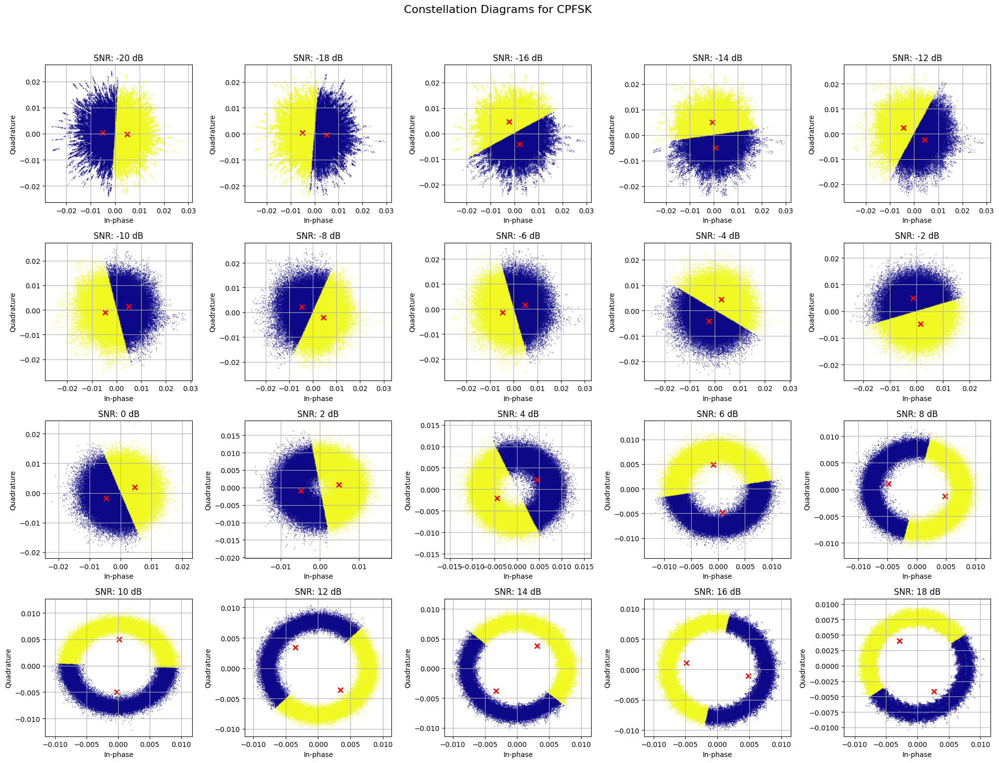

Analysis completed for: CPFSK
Analyzing modulation type: PAM4...


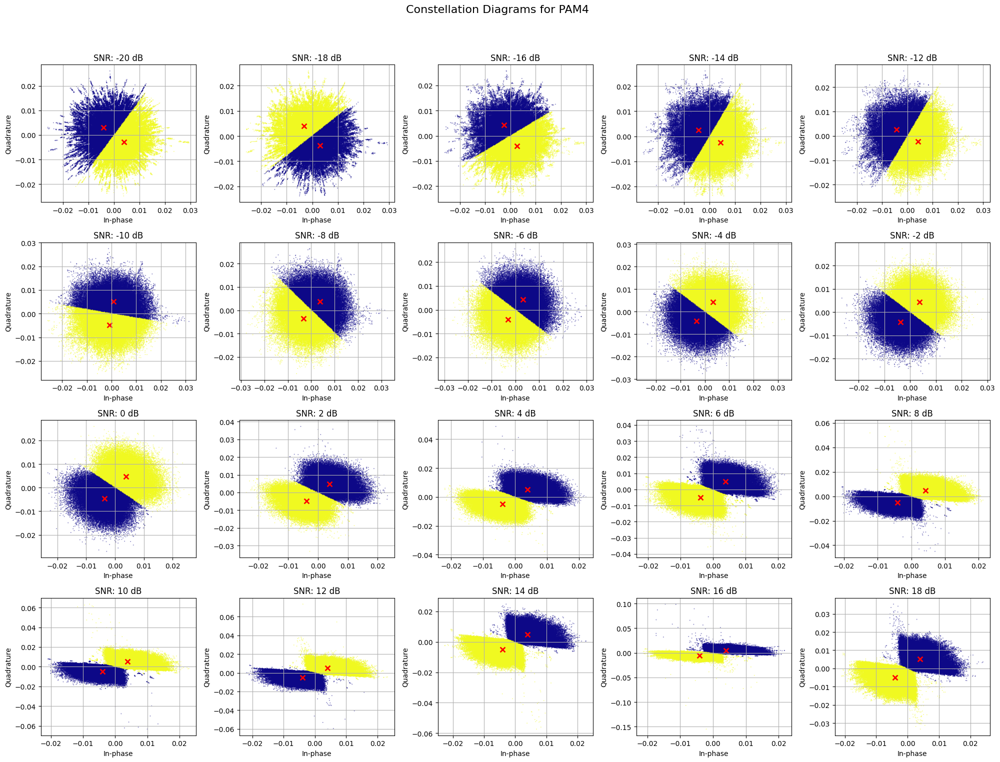

Analysis completed for: PAM4
Analyzing modulation type: WBFM...


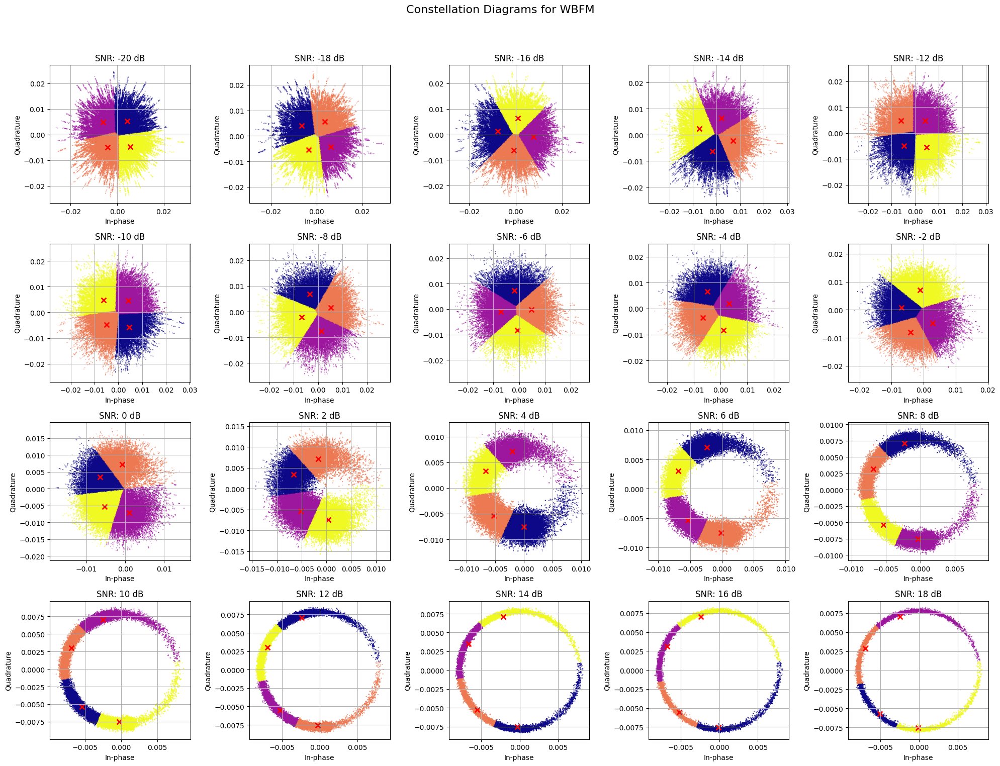

Analysis completed for: WBFM
Analyzing modulation type: QAM64...


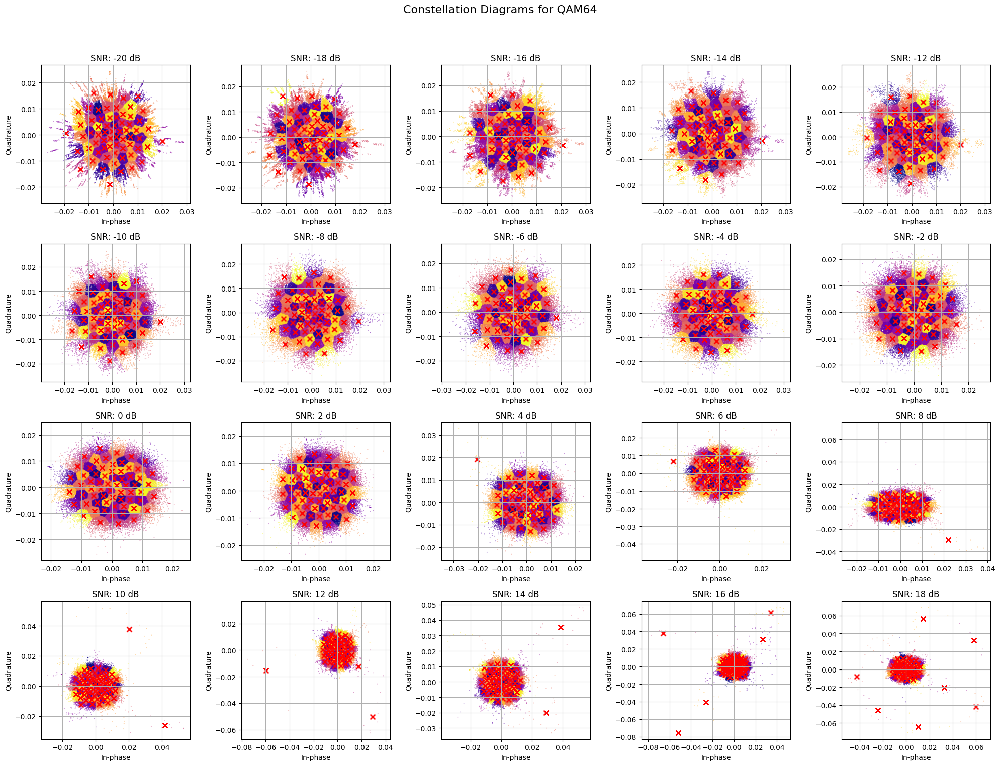

Analysis completed for: QAM64
Analyzing modulation type: AM-DSB...


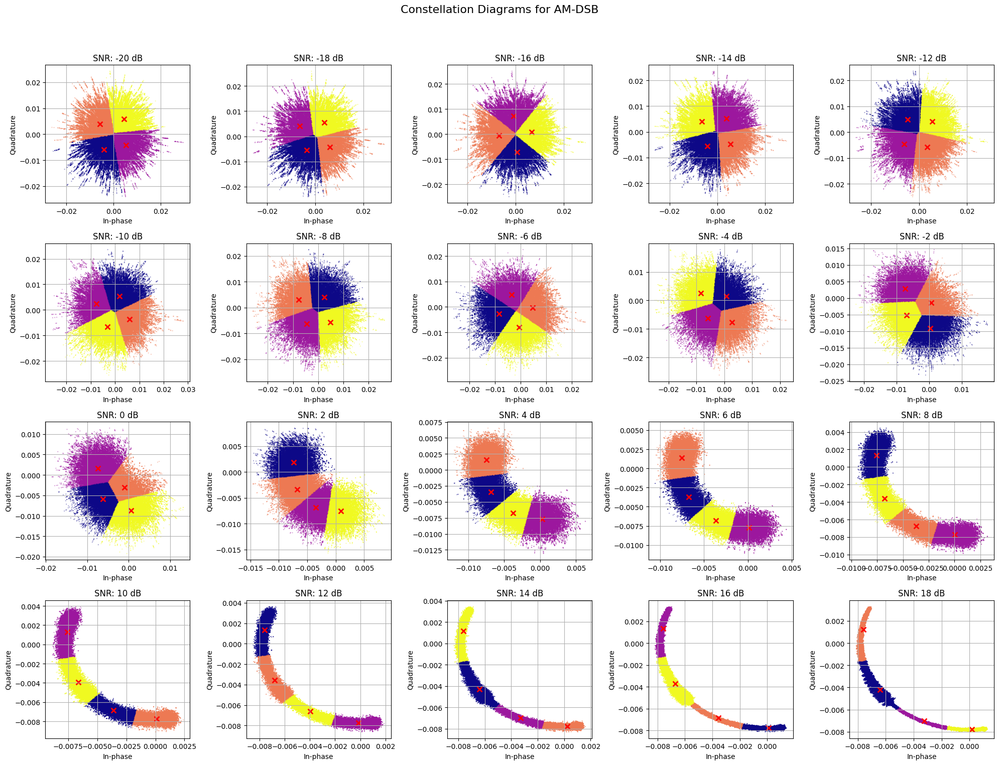

Analysis completed for: AM-DSB
Analyzing modulation type: GFSK...


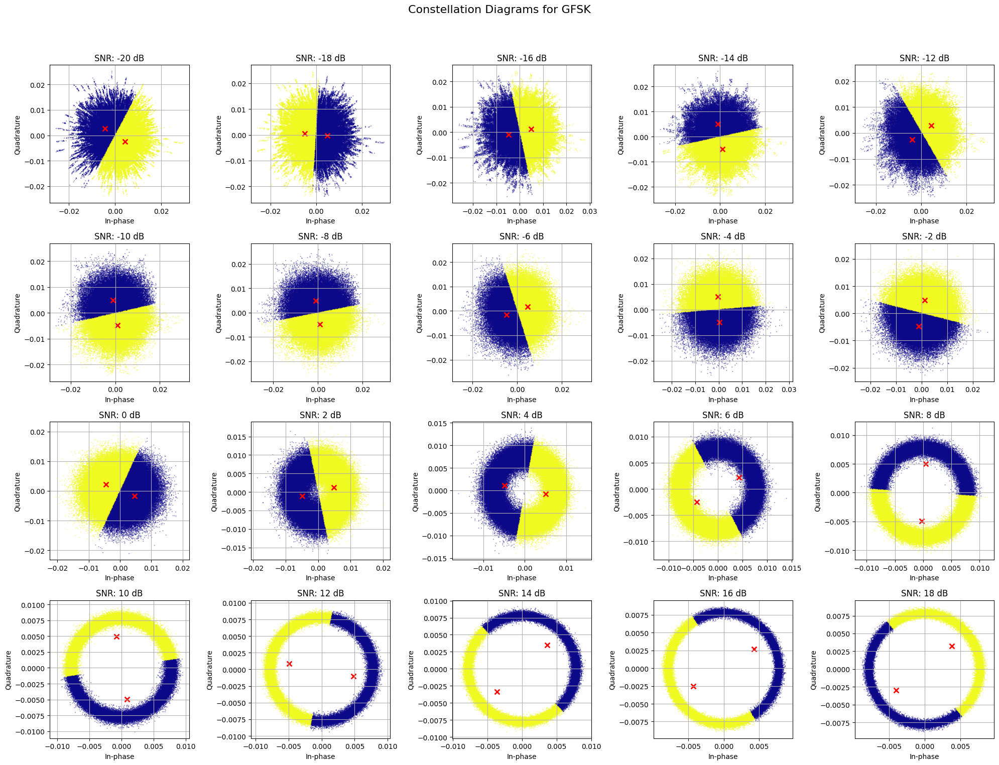

Analysis completed for: GFSK
Analyzing modulation type: QPSK...


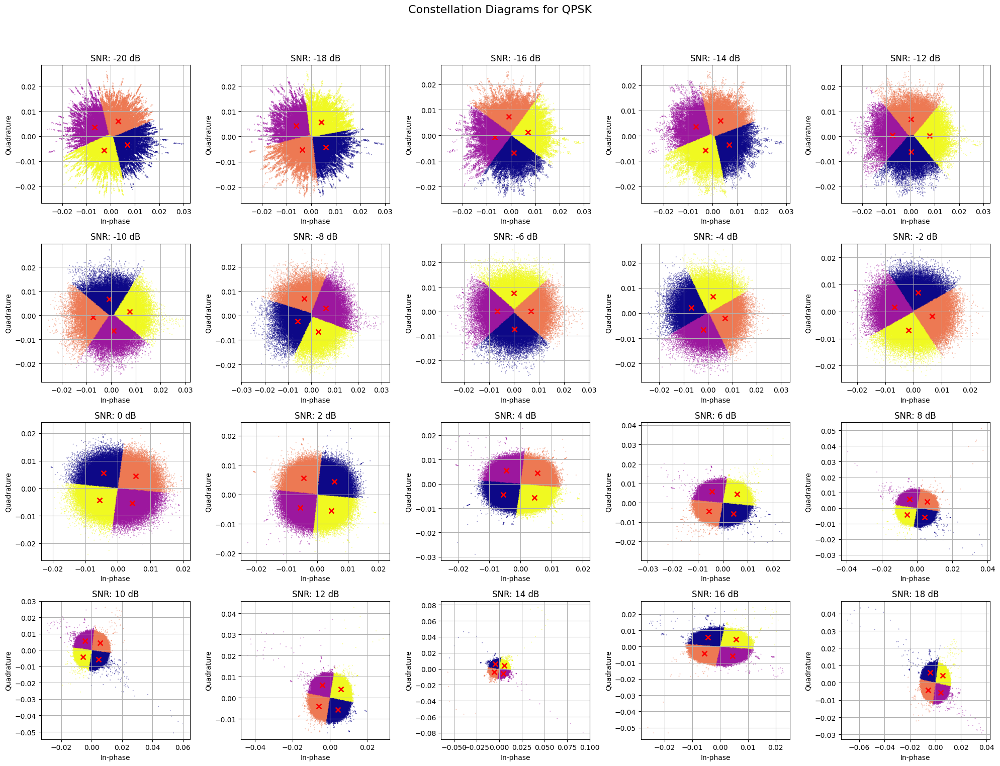

Analysis completed for: QPSK
Analyzing modulation type: QAM16...


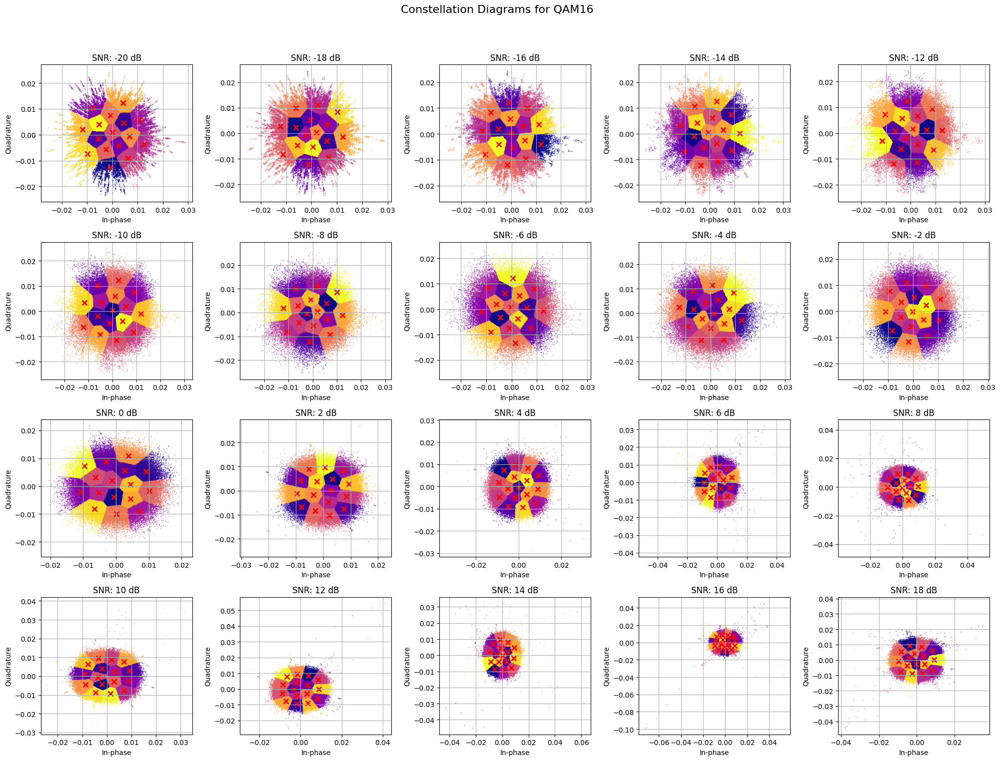

Analysis completed for: QAM16
Analyzing modulation type: BPSK...


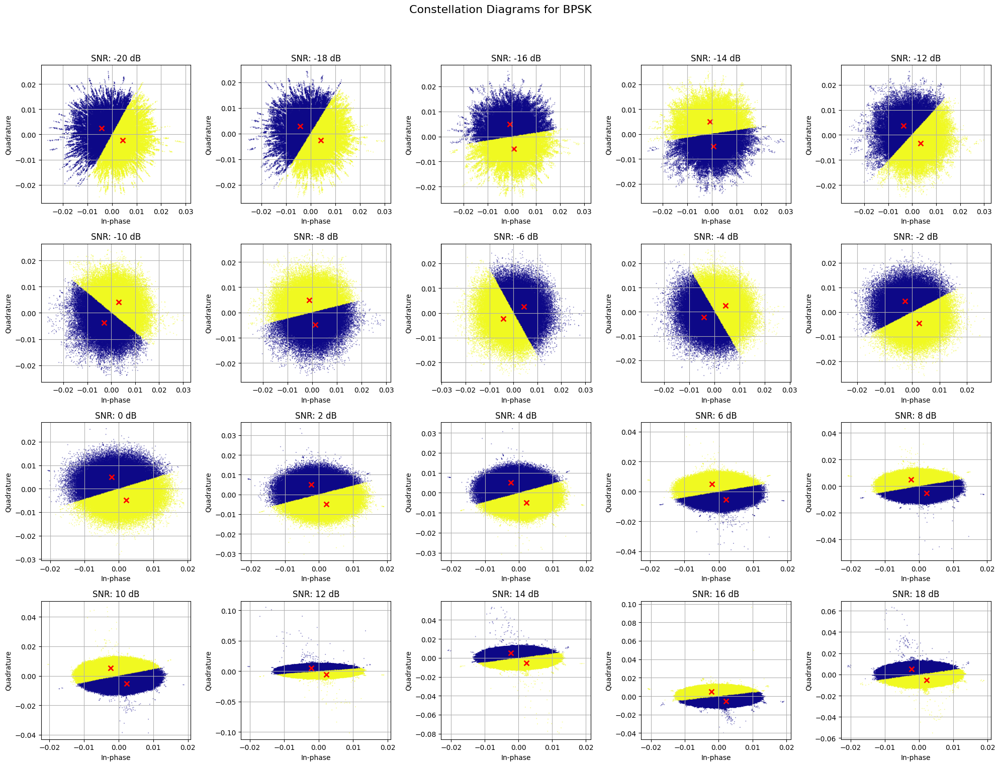

Analysis completed for: BPSK
Analyzing modulation type: 8PSK...


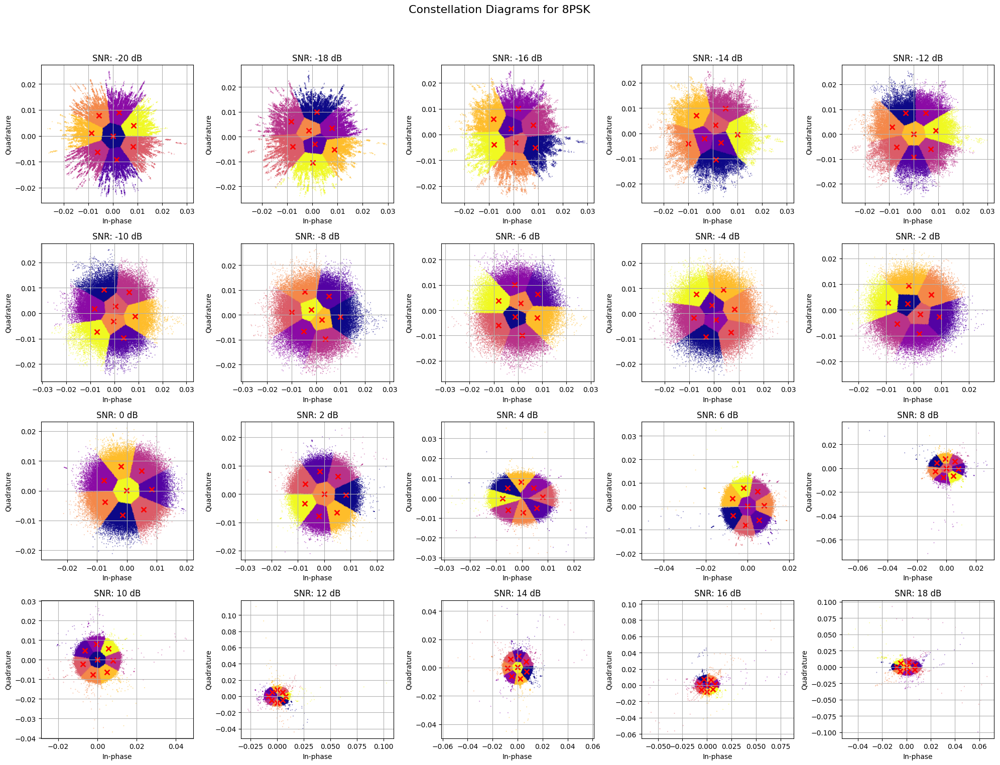

Analysis completed for: 8PSK
Analyzing modulation type: AM-SSB...


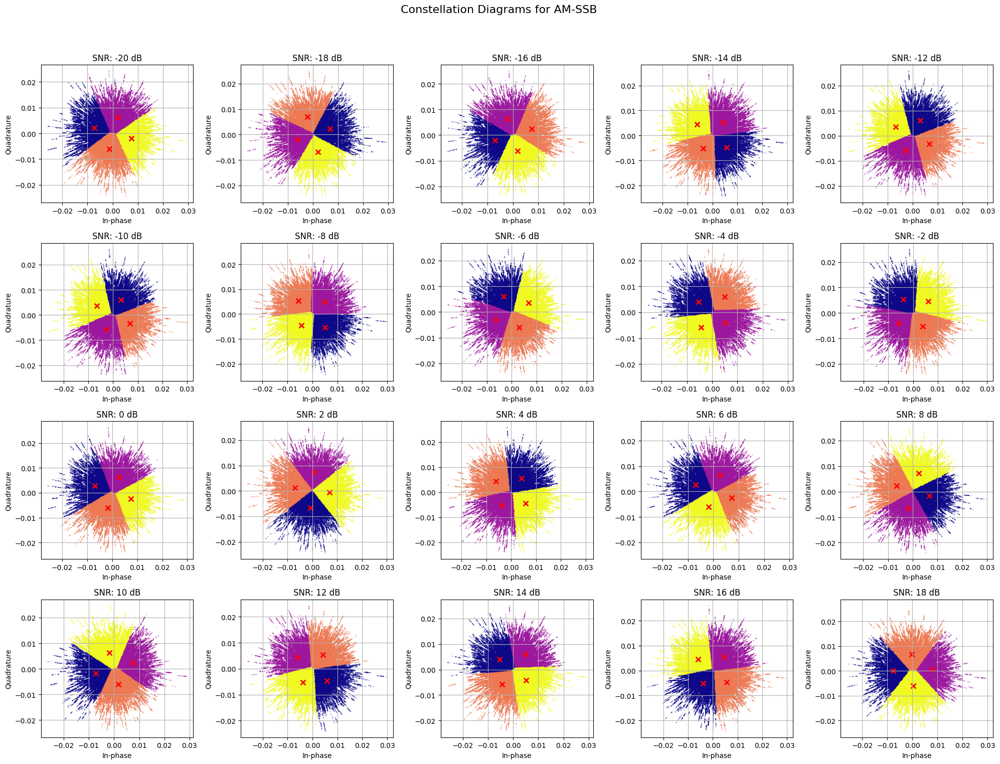

Analysis completed for: AM-SSB


In [12]:
constellation_analysis = {}

for modulation in modulation_forms:
    print(f"Analyzing modulation type: {modulation}...")
    
    constellation_analysis[modulation] = display_constellations(modulation, data)
    
    print(f"Analysis completed for: {modulation}")

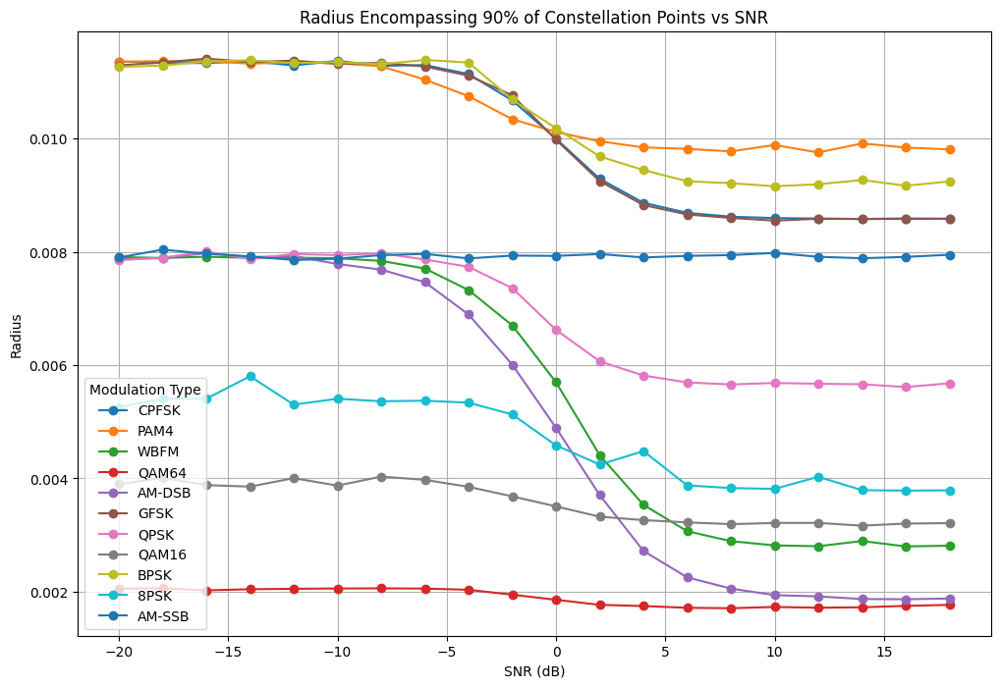

In [13]:
# Crear la figura
plt.figure(figsize=(12, 8))

# Recorrer cada tipo de modulación
for modulation_type in modulation_forms:
    snr_values, radius_90_percent = zip(*constellation_analysis[modulation_type])  # Cambié 'results' a 'constellation_analysis'
    
    # Graficar SNR vs Radio para cada tipo de modulación
    plt.plot(snr_values, radius_90_percent, marker='o', linestyle='-', label=modulation_type)

# Configuración de título y etiquetas
plt.title('Radius Encompassing 90% of Constellation Points vs SNR')
plt.xlabel('SNR (dB)')
plt.ylabel('Radius')
plt.legend(title='Modulation Type')  # Añadir título a la leyenda
plt.grid(True)

# Mostrar la gráfica
plt.show()


Dataset shape: (30000, 256)
Labels shape: (30000,)
SNR levels included: [0, 2, 4, 6, 8, 10, 12, 14, 16, 18]
Epoch 1/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step - accuracy: 0.3362 - loss: 1.0986 - val_accuracy: 0.5777 - val_loss: 1.0234
Epoch 2/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.6807 - loss: 0.7381 - val_accuracy: 0.7723 - val_loss: 0.5643
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - accuracy: 0.7782 - loss: 0.5579 - val_accuracy: 0.7771 - val_loss: 0.5467
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - accuracy: 0.7664 - loss: 0.5688 - val_accuracy: 0.7746 - val_loss: 0.5404
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.7725 - loss: 0.5454 - val_accuracy: 0.7635 - val_loss: 0.5626
Epoch 6/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - accuracy: 0.7786 - loss: 0.5452 - val_accuracy: 0.7735 - val_loss: 0.5506
Epoch 7/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step - accuracy: 0.7784 - loss: 0.5285 - val_accuracy: 0.7821 -

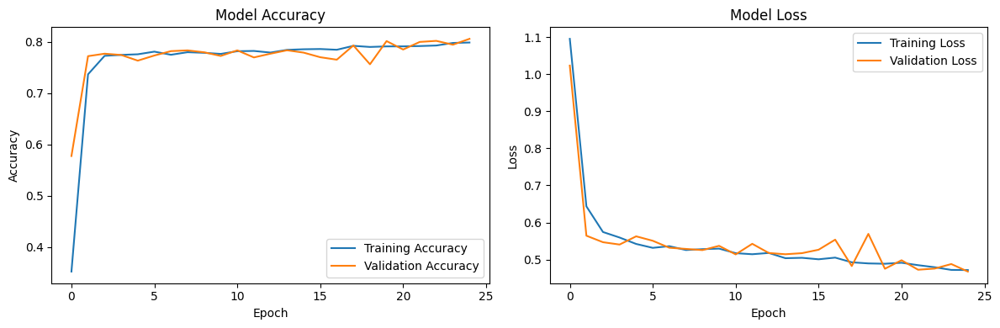

188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
              precision    recall  f1-score   support

        PAM4       0.94      0.80      0.87      1996
       QAM16       0.72      0.79      0.76      2002
        QPSK       0.80      0.84      0.82      2002

    accuracy                           0.81      6000
   macro avg       0.82      0.81      0.81      6000
weighted avg       0.82      0.81      0.81      6000



In [14]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Desired modulation types
modulation_types = ['QPSK', 'PAM4', 'QAM16']

# Lists to hold I/Q data and labels
iq_data = []
labels = []

# Get all SNR levels and filter out those below 0
all_snr_levels = sorted({key[1] for key in data.keys()})
filtered_snr_levels = [snr for snr in all_snr_levels if snr >= 0]

# Loop through each modulation and SNR level
for mod_type in modulation_types:
    for snr in filtered_snr_levels:
        key = (mod_type, snr)
        signals = data[key]  # shape is (1000, 2, 128)

        # Combine I and Q into a single array
        iq_combined = np.reshape(signals, (signals.shape[0], -1))  # shape (1000, 256)

        iq_data.append(iq_combined)
        labels.extend([mod_type] * signals.shape[0])

# Convert to numpy arrays
iq_data = np.concatenate(iq_data, axis=0)
labels = np.array(labels)

print(f"Dataset shape: {iq_data.shape}")
print(f"Labels shape: {labels.shape}")
print(f"SNR levels included: {filtered_snr_levels}")

# Encode labels
le = LabelEncoder()
labels_encoded = le.fit_transform(labels)
labels_categorical = keras.utils.to_categorical(labels_encoded)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(iq_data, labels_categorical, test_size=0.2, random_state=42)

# Reshape data for 1D CNN
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

# Define the model
model = keras.Sequential([
    keras.layers.Input(shape=(256, 1)),
    keras.layers.Conv1D(64, 3, activation='relu'),
    keras.layers.MaxPooling1D(2),
    keras.layers.Conv1D(128, 3, activation='relu'),
    keras.layers.MaxPooling1D(2),
    keras.layers.Conv1D(128, 3, activation='relu'),
    keras.layers.GlobalAveragePooling1D(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(3, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=25,
    batch_size=64,
    validation_split=0.2,
    verbose=1
)

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')

# Plot training history
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)

# Print classification report
from sklearn.metrics import classification_report
print(classification_report(true_classes, predicted_classes, target_names=le.classes_))